# Convolutional Neural Networks

## Project: Write an Algorithm for Landmark Classification

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to HTML, all the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.

---
### Why We're Here

Photo sharing and photo storage services like to have location data for each photo that is uploaded. With the location data, these services can build advanced features, such as automatic suggestion of relevant tags or automatic photo organization, which help provide a compelling user experience. Although a photo's location can often be obtained by looking at the photo's metadata, many photos uploaded to these services will not have location metadata available. This can happen when, for example, the camera capturing the picture does not have GPS or if a photo's metadata is scrubbed due to privacy concerns.

If no location metadata for an image is available, one way to infer the location is to detect and classify a discernible landmark in the image. Given the large number of landmarks across the world and the immense volume of images that are uploaded to photo sharing services, using human judgement to classify these landmarks would not be feasible.

In this notebook, you will take the first steps towards addressing this problem by building models to automatically predict the location of the image based on any landmarks depicted in the image. At the end of this project, your code will accept any user-supplied image as input and suggest the top k most relevant landmarks from 50 possible landmarks from across the world. The image below displays a potential sample output of your finished project.

![Sample landmark classification output](images/sample_landmark_output.png)


### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Download Datasets and Install Python Modules
* [Step 1](#step1): Create a CNN to Classify Landmarks (from Scratch)
* [Step 2](#step2): Create a CNN to Classify Landmarks (using Transfer Learning)
* [Step 3](#step3): Write Your Landmark Prediction Algorithm

---
<a id='step0'></a>
## Step 0: Download Datasets and Install Python Modules

**Note: if you are using the Udacity workspace, *YOU CAN SKIP THIS STEP*. The dataset can be found in the `/data` folder and all required Python modules have been installed in the workspace.**

Download the [landmark dataset](https://udacity-dlnfd.s3-us-west-1.amazonaws.com/datasets/landmark_images.zip).
Unzip the folder and place it in this project's home directory, at the location `/landmark_images`.

Install the following Python modules:
* cv2
* matplotlib
* numpy
* PIL
* torch
* torchvision

---

<a id='step1'></a>
## Step 1: Create a CNN to Classify Landmarks (from Scratch)

In this step, you will create a CNN that classifies landmarks.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 20%.

Although 20% may seem low at first glance, it seems more reasonable after realizing how difficult of a problem this is. Many times, an image that is taken at a landmark captures a fairly mundane image of an animal or plant, like in the following picture.

<img src="images/train/00.Haleakala_National_Park/084c2aa50d0a9249.jpg" alt="Bird in Haleakalā National Park" style="width: 400px;"/>

Just by looking at that image alone, would you have been able to guess that it was taken at the Haleakalā National Park in Hawaii?

An accuracy of 20% is significantly better than random guessing, which would provide an accuracy of just 2%. In Step 2 of this notebook, you will have the opportunity to greatly improve accuracy by using transfer learning to create a CNN.

Remember that practice is far ahead of theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Landmark Dataset

Use the code cell below to create three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader): one for training data, one for validation data, and one for test data. Randomly split the images located at `landmark_images/train` to create the train and validation data loaders, and use the images located at `landmark_images/test` to create the test data loader.

All three of your data loaders should be accessible via a dictionary named `loaders_scratch`. Your train data loader should be at `loaders_scratch['train']`, your validation data loader should be at `loaders_scratch['valid']`, and your test data loader should be at `loaders_scratch['test']`.

You may find [this documentation on custom datasets](https://pytorch.org/docs/stable/torchvision/datasets.html#datasetfolder) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [73]:
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

import torch
import numpy as np
import torch.nn as nn
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import os
import glob
from PIL import Image
import matplotlib.pyplot as plt
from collections import Counter

data_dir = 'landmark_images/'
train_dir = os.path.join(data_dir, 'train/')
test_dir = os.path.join(data_dir, 'test/')

In [48]:
sizes = []

for img_path in glob.glob(os.path.join(train_dir, "**/*.jpg")):
    sizes.append(Image.open(img_path).size)

In [74]:
counts = Counter(sizes)

In [79]:
counts.most_common(10)

[((800, 600), 1332),
 ((800, 533), 1080),
 ((600, 800), 331),
 ((800, 450), 228),
 ((800, 531), 164),
 ((533, 800), 160),
 ((800, 529), 75),
 ((800, 535), 63),
 ((800, 532), 49),
 ((640, 480), 49)]

In [2]:

# Simulate an unsteady hand for some of the photos by adding a rotation of 2 degrees.
train_transform = transforms.Compose([transforms.RandomResizedCrop(224),
                                      transforms.RandomRotation(2),
                                      transforms.ToTensor()])

# For testing, original images will be used.
test_transform = transforms.Compose([transforms.RandomResizedCrop(224),
                                     transforms.ToTensor()])

train_data = datasets.ImageFolder(train_dir, transform=train_transform)
test_data = datasets.ImageFolder(test_dir, transform=test_transform)

# define dataloader parameters
batch_size = 64 # Suitable for a Founders Edition 3080 Ti
num_workers=0
valid_size = 0.2

# Split the train dataset into a train/validate set. 
# This code was modified from an earlier exercise in the CNN course.
num_train = len(train_data)
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_indices, validate_indices = indices[split:], indices[:split]

print('training images: ', len(train_indices))
print('test images: ', len(test_data))
print('validate images: ', len(validate_indices))

# Samplers for train and validation batches
train_sampler = SubsetRandomSampler(train_indices)
validate_sampler = SubsetRandomSampler(validate_indices)

# prepare data loaders
train_loader = torch.utils.data.DataLoader(
    train_data,
    batch_size=batch_size, 
    sampler=train_sampler,
    num_workers=num_workers)

validate_loader = torch.utils.data.DataLoader(
    train_data, 
    batch_size=batch_size, 
    sampler=validate_sampler,
    num_workers=num_workers)

test_loader = torch.utils.data.DataLoader(
    test_data, 
    batch_size=batch_size,
    num_workers=num_workers)

loaders_scratch = {'train': train_loader, 'valid': validate_loader, 'test': test_loader}


training images:  3997
test images:  1250
validate images:  999


**Question 1:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?

- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?

**Answer**: 

1. My code randomly resizes and crops the images to a 224x224 pixel square. A resize operation will simulate photos taken at different distances from the landmark.  The random crop location will allow the CNN to recognize landmarks in the event the landmark is not fully in view in the input image. The 224x224 size was chosen to control for as many variables as possible when comparing the performance of a from-scratch CNN vs. the transfer learning CNN from the next step. The ResNet50 model I used for transfer learning in the next step was pre-trained on 224x224 images.

2. Yes, I added a small degree of random rotation to images up to 2 degrees. The intention was to simulate unsteady hands while photographing. Flips and translations (aside from the implied translation from a random resize crop) were not included. Flips because landscape photos wouldn't typically be horizontally or vertically flipped, unlike say a selfie, which could be a mirror image or flipped left to right.

### (IMPLEMENTATION) Visualize a Batch of Training Data

Use the code cell below to retrieve a batch of images from your train data loader, display at least 5 images simultaneously, and label each displayed image with its class name (e.g., "Golden Gate Bridge").

Visualizing the output of your data loader is a great way to ensure that your data loading and preprocessing are working as expected.

In [7]:
train_data.class_to_idx

{'00.Haleakala_National_Park': 0,
 '01.Mount_Rainier_National_Park': 1,
 '02.Ljubljana_Castle': 2,
 '03.Dead_Sea': 3,
 '04.Wroclaws_Dwarves': 4,
 '05.London_Olympic_Stadium': 5,
 '06.Niagara_Falls': 6,
 '07.Stonehenge': 7,
 '08.Grand_Canyon': 8,
 '09.Golden_Gate_Bridge': 9,
 '10.Edinburgh_Castle': 10,
 '11.Mount_Rushmore_National_Memorial': 11,
 '12.Kantanagar_Temple': 12,
 '13.Yellowstone_National_Park': 13,
 '14.Terminal_Tower': 14,
 '15.Central_Park': 15,
 '16.Eiffel_Tower': 16,
 '17.Changdeokgung': 17,
 '18.Delicate_Arch': 18,
 '19.Vienna_City_Hall': 19,
 '20.Matterhorn': 20,
 '21.Taj_Mahal': 21,
 '22.Moscow_Raceway': 22,
 '23.Externsteine': 23,
 '24.Soreq_Cave': 24,
 '25.Banff_National_Park': 25,
 '26.Pont_du_Gard': 26,
 '27.Seattle_Japanese_Garden': 27,
 '28.Sydney_Harbour_Bridge': 28,
 '29.Petronas_Towers': 29,
 '30.Brooklyn_Bridge': 30,
 '31.Washington_Monument': 31,
 '32.Hanging_Temple': 32,
 '33.Sydney_Opera_House': 33,
 '34.Great_Barrier_Reef': 34,
 '35.Monumento_a_la_Revolu

In [8]:
train_data.classes

['00.Haleakala_National_Park',
 '01.Mount_Rainier_National_Park',
 '02.Ljubljana_Castle',
 '03.Dead_Sea',
 '04.Wroclaws_Dwarves',
 '05.London_Olympic_Stadium',
 '06.Niagara_Falls',
 '07.Stonehenge',
 '08.Grand_Canyon',
 '09.Golden_Gate_Bridge',
 '10.Edinburgh_Castle',
 '11.Mount_Rushmore_National_Memorial',
 '12.Kantanagar_Temple',
 '13.Yellowstone_National_Park',
 '14.Terminal_Tower',
 '15.Central_Park',
 '16.Eiffel_Tower',
 '17.Changdeokgung',
 '18.Delicate_Arch',
 '19.Vienna_City_Hall',
 '20.Matterhorn',
 '21.Taj_Mahal',
 '22.Moscow_Raceway',
 '23.Externsteine',
 '24.Soreq_Cave',
 '25.Banff_National_Park',
 '26.Pont_du_Gard',
 '27.Seattle_Japanese_Garden',
 '28.Sydney_Harbour_Bridge',
 '29.Petronas_Towers',
 '30.Brooklyn_Bridge',
 '31.Washington_Monument',
 '32.Hanging_Temple',
 '33.Sydney_Opera_House',
 '34.Great_Barrier_Reef',
 '35.Monumento_a_la_Revolucion',
 '36.Badlands_National_Park',
 '37.Atomium',
 '38.Forth_Bridge',
 '39.Gateway_of_India',
 '40.Stockholm_City_Hall',
 '41.Ma

In [9]:
index_to_class = {int(index):label for (label, index) in train_data.class_to_idx.items()}

{0: '00.Haleakala_National_Park', 1: '01.Mount_Rainier_National_Park', 2: '02.Ljubljana_Castle', 3: '03.Dead_Sea', 4: '04.Wroclaws_Dwarves', 5: '05.London_Olympic_Stadium', 6: '06.Niagara_Falls', 7: '07.Stonehenge', 8: '08.Grand_Canyon', 9: '09.Golden_Gate_Bridge', 10: '10.Edinburgh_Castle', 11: '11.Mount_Rushmore_National_Memorial', 12: '12.Kantanagar_Temple', 13: '13.Yellowstone_National_Park', 14: '14.Terminal_Tower', 15: '15.Central_Park', 16: '16.Eiffel_Tower', 17: '17.Changdeokgung', 18: '18.Delicate_Arch', 19: '19.Vienna_City_Hall', 20: '20.Matterhorn', 21: '21.Taj_Mahal', 22: '22.Moscow_Raceway', 23: '23.Externsteine', 24: '24.Soreq_Cave', 25: '25.Banff_National_Park', 26: '26.Pont_du_Gard', 27: '27.Seattle_Japanese_Garden', 28: '28.Sydney_Harbour_Bridge', 29: '29.Petronas_Towers', 30: '30.Brooklyn_Bridge', 31: '31.Washington_Monument', 32: '32.Hanging_Temple', 33: '33.Sydney_Opera_House', 34: '34.Great_Barrier_Reef', 35: '35.Monumento_a_la_Revolucion', 36: '36.Badlands_Nationa

In [ ]:
print(index_to_class)
print(type(index_to_class[0]))
print(type(next(iter(index_to_class.keys()))))

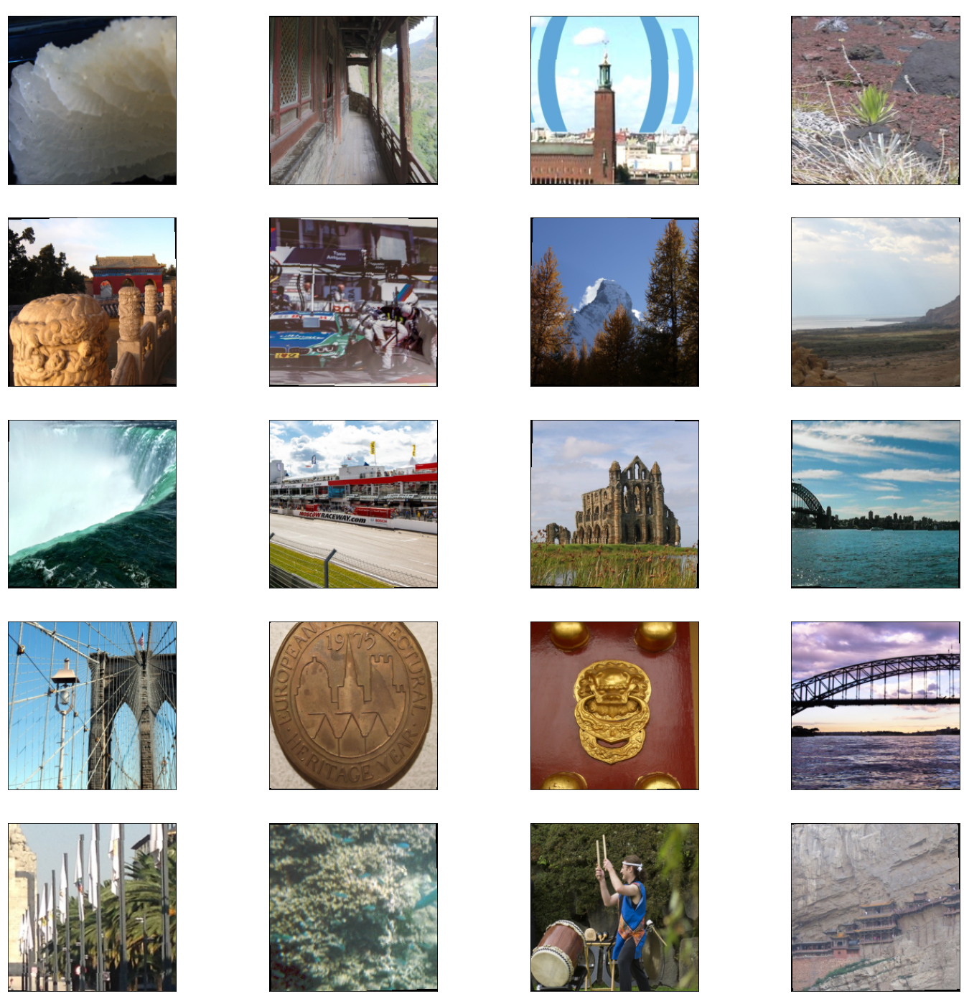

In [94]:
import matplotlib.pyplot as plt
%matplotlib inline

## TODO: visualize a batch of the train data loader

def plot_sample(data_loader):
    dataiter = iter(data_loader)
    images, labels = dataiter.next()
    images = images.numpy() # convert images to numpy for display

    # plot the images in the batch, along with the corresponding labels
    fig = plt.figure(figsize=(25, 25))
    # display 20 images
    for idx in np.arange(20):
        ax = fig.add_subplot(5, 4, idx+1, xticks=[], yticks=[])
        plt.imshow(np.transpose(images[idx], (1, 2, 0)))
        label = index_to_class[int(labels[idx])]
        #print(label)
        ax.set_title(label, color='white')
        
plot_sample(train_loader)

### Initialize use_cuda variable

In [85]:
# useful variable that tells us whether we should use the GPU
use_cuda = torch.cuda.is_available()
use_cuda

True

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and fill in the function `get_optimizer_scratch` below.

In [86]:
## TODO: select loss function
import torch.nn as nn
import torch.optim as optim

# specify loss function (categorical cross-entropy)
criterion_scratch = nn.CrossEntropyLoss()

# specify optimizer
def get_optimizer_scratch(model):
    ## TODO: select and return an optimizer
    return optim.SGD(model.parameters(), lr=0.01)

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify images of landmarks.  Use the template in the code cell below.

In [87]:
  
class Net(nn.Module):
    ## TODO: choose an architecture, and complete the class
    def __init__(self, num_classes=50):
        super(Net, self).__init__()
        ## Define layers of a CNN
        
        # convolutional layer (sees 224x224x3 image tensor)
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        # convolutional layer (sees 112x112x16 tensor)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        # convolutional layer (sees 56x56x32 tensor)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        # max pooling layer
        self.pool = nn.MaxPool2d(2, 2)
        # linear layer (28x28x64 -> 500)
        self.fc1 = nn.Linear(64 * 28 * 28, 500)
        # linear layer (500 -> 50), output is the image class probabilities
        self.fc2 = nn.Linear(500, num_classes)
        # dropout layer (p=0.25)
        self.dropout = nn.Dropout(0.25)
        
    def forward(self, x):
        ## Define forward behavior
        # add sequence of convolutional and max pooling layers
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = self.pool(torch.relu(self.conv3(x)))
        # flatten image input
        x = x.view(x.size(0), -1)
        # add dropout layer
        x = self.dropout(x)
        # add 1st hidden layer, with relu activation function
        x = torch.relu(self.fc1(x))
        # add dropout layer
        x = self.dropout(x)
        # add 2nd hidden layer, with relu activation function
        x = self.fc2(x)
        
        return x

#-#-# Do NOT modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()
print(model_scratch)

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

Net(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=50176, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=50, bias=True)
  (dropout): Dropout(p=0.25, inplace=False)
)


__Question 2:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__  

I reused the model defined in the Lesson 4 transfer learning exercise solutions.  Since this model was proposed for identifying objects like cars, horses, birds, etc, I figured it would generalize for mountains, buildings, and other landmarks as well

The initial training run using 100 epochs provided 24% accuracy.

### (IMPLEMENTATION) Implement the Training Algorithm

Implement your training algorithm in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at the filepath stored in the variable `save_path`.

In [85]:
def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        # set the module to training mode
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()

            ## TODO: find the loss and update the model parameters accordingly
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data.item() - train_loss))
            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()
            # update training loss
            train_loss += ((1 / (batch_idx + 1)) * (loss.data.item() - train_loss)) #loss.item()*data.size(0)

        ######################    
        # validate the model #
        ######################
        # set the model to evaluation mode
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()

            ## TODO: update average validation loss 
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # update average validation loss 
            valid_loss += ((1 / (batch_idx + 1)) * (loss.data.item() - valid_loss))# loss.item()*data.size(0)

        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))

        ## TODO: if the validation loss has decreased, save the model at the filepath stored in save_path
        if valid_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
                valid_loss_min,
                valid_loss))
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
        
    return model

### (IMPLEMENTATION) Experiment with the Weight Initialization

Use the code cell below to define a custom weight initialization, and then train with your weight initialization for a few epochs. Make sure that neither the training loss nor validation loss is `nan`.

Later on, you will be able to see how this compares to training with PyTorch's default weight initialization.

In [92]:
def custom_weight_init(m):
    ## TODO: implement a weight initialization strategy
    classname = m.__class__.__name__
    # for every Linear layer in a model..
    if classname.find('Linear') != -1:
        y = (1.0/np.sqrt(m.in_features))
        m.weight.data.normal_(0, y)
        m.bias.data.fill_(0)
    
#-#-# Do NOT modify the code below this line. #-#-#
    
model_scratch.apply(custom_weight_init)
model_scratch = train(20, loaders_scratch, model_scratch, get_optimizer_scratch(model_scratch),
                      criterion_scratch, use_cuda, 'ignore.pt')

Epoch: 1 	Training Loss: 3.740309 	Validation Loss: 3.582989
Validation loss decreased (inf --> 3.582989).  Saving model ...
Epoch: 2 	Training Loss: 3.530685 	Validation Loss: 3.505497
Validation loss decreased (3.582989 --> 3.505497).  Saving model ...
Epoch: 3 	Training Loss: 3.422601 	Validation Loss: 3.460094
Validation loss decreased (3.505497 --> 3.460094).  Saving model ...
Epoch: 4 	Training Loss: 3.356469 	Validation Loss: 3.367980
Validation loss decreased (3.460094 --> 3.367980).  Saving model ...
Epoch: 5 	Training Loss: 3.301208 	Validation Loss: 3.411250
Epoch: 6 	Training Loss: 3.264208 	Validation Loss: 3.369033
Epoch: 7 	Training Loss: 3.215820 	Validation Loss: 3.332350
Validation loss decreased (3.367980 --> 3.332350).  Saving model ...
Epoch: 8 	Training Loss: 3.169679 	Validation Loss: 3.283188
Validation loss decreased (3.332350 --> 3.283188).  Saving model ...
Epoch: 9 	Training Loss: 3.143175 	Validation Loss: 3.258387
Validation loss decreased (3.283188 --> 3.

### (IMPLEMENTATION) Train and Validate the Model

Run the next code cell to train your model.

In [90]:
## TODO: you may change the number of epochs if you'd like,
## but changing it is not required
num_epochs = 100

#-#-# Do NOT modify the code below this line. #-#-#

# function to re-initialize a model with pytorch's default weight initialization
def default_weight_init(m):
    reset_parameters = getattr(m, 'reset_parameters', None)
    if callable(reset_parameters):
        m.reset_parameters()

# reset the model parameters
model_scratch.apply(default_weight_init)

# train the model
model_scratch = train(num_epochs, loaders_scratch, model_scratch, get_optimizer_scratch(model_scratch), 
                      criterion_scratch, use_cuda, 'model_scratch.pt')

Epoch: 1 	Training Loss: 3.912714 	Validation Loss: 3.912743
Validation loss decreased (inf --> 3.912743).  Saving model ...
Epoch: 2 	Training Loss: 3.912080 	Validation Loss: 3.913096
Epoch: 3 	Training Loss: 3.911617 	Validation Loss: 3.913073
Epoch: 4 	Training Loss: 3.911095 	Validation Loss: 3.912830
Epoch: 5 	Training Loss: 3.910667 	Validation Loss: 3.912688
Validation loss decreased (3.912743 --> 3.912688).  Saving model ...
Epoch: 6 	Training Loss: 3.909724 	Validation Loss: 3.912414
Validation loss decreased (3.912688 --> 3.912414).  Saving model ...
Epoch: 7 	Training Loss: 3.908881 	Validation Loss: 3.911406
Validation loss decreased (3.912414 --> 3.911406).  Saving model ...
Epoch: 8 	Training Loss: 3.907133 	Validation Loss: 3.910859
Validation loss decreased (3.911406 --> 3.910859).  Saving model ...
Epoch: 9 	Training Loss: 3.906374 	Validation Loss: 3.908921
Validation loss decreased (3.910859 --> 3.908921).  Saving model ...
Epoch: 10 	Training Loss: 3.904343 	Valida

### (IMPLEMENTATION) Test the Model

Run the code cell below to try out your model on the test dataset of landmark images. Run the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 20%.

In [88]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    # set the module to evaluation mode
    model.eval()

    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data.item() - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

In [89]:
# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 2.979403


Test Accuracy: 24% (311/1250)


---
<a id='step2'></a>
## Step 2: Create a CNN to Classify Landmarks (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify landmarks from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Landmark Dataset

Use the code cell below to create three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader): one for training data, one for validation data, and one for test data. Randomly split the images located at `landmark_images/train` to create the train and validation data loaders, and use the images located at `landmark_images/test` to create the test data loader.

All three of your data loaders should be accessible via a dictionary named `loaders_transfer`. Your train data loader should be at `loaders_transfer['train']`, your validation data loader should be at `loaders_transfer['valid']`, and your test data loader should be at `loaders_transfer['test']`.

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [18]:
torch.cuda.empty_cache()

use_cuda = torch.cuda.is_available()

In [11]:
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

# As per this tutorial, the tensor is normalized: https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html

# Simulate an unsteady hand for some of the photos by adding a rotation.
transfer_train_transform = transforms.Compose([
                                        transforms.RandomResizedCrop(224),
                                        transforms.RandomRotation(2),
                                        transforms.ToTensor(),
                                        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

transfer_test_transform = transforms.Compose([
                                        transforms.Resize(256),
                                        transforms.CenterCrop(224),
                                        transforms.ToTensor(),
                                        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

transfer_train_data = datasets.ImageFolder(train_dir, transform=transfer_train_transform)
transfer_test_data = datasets.ImageFolder(test_dir, transform=transfer_test_transform)

# define dataloader parameters
transfer_batch_size = 32 # Determined experimentally on a 3080 Ti
transfer_num_workers = 0
transfer_valid_size = 0.2

# obtain training indices that will be used for validation
transfer_num_train = len(transfer_train_data)
transfer_indices = list(range(transfer_num_train))
np.random.shuffle(transfer_indices)
split = int(np.floor(transfer_valid_size * transfer_num_train))
transfer_train_indices, transfer_validate_indices = transfer_indices[split:], transfer_indices[:split]

# print out some data stats
print('training images: ', len(transfer_train_indices))
print('test images: ', len(transfer_test_data))
print('validate images: ', len(transfer_validate_indices))

# Samplers for train and validation batches
transfer_train_sampler = SubsetRandomSampler(transfer_train_indices)
transfer_validate_sampler = SubsetRandomSampler(transfer_validate_indices)

# prepare data loaders
transfer_train_loader = torch.utils.data.DataLoader(
    transfer_train_data,
    batch_size=batch_size, 
    sampler=transfer_train_sampler,
    num_workers=num_workers)

transfer_validate_loader = torch.utils.data.DataLoader(
    transfer_train_data, 
    batch_size=batch_size, 
    sampler=transfer_validate_sampler,
    num_workers=num_workers)

transfer_test_loader = torch.utils.data.DataLoader(
    transfer_test_data, 
    batch_size=batch_size,
    num_workers=num_workers)

loaders_transfer = {'train': transfer_train_loader, 'valid': transfer_validate_loader, 'test': transfer_test_loader}

index_to_class_transfer = {int(index):label for (label, index) in transfer_train_data.class_to_idx.items()}


training images:  3997
test images:  1250
validate images:  999


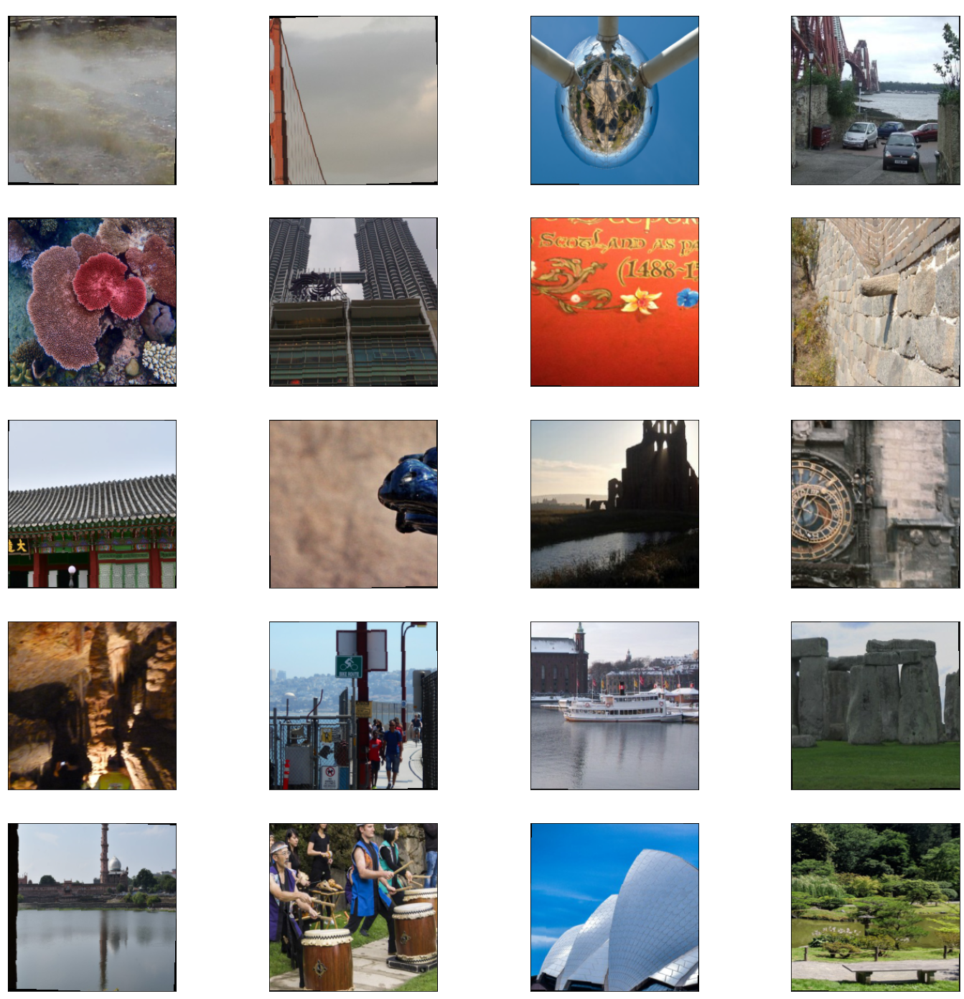

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline

def transfer_plot_sample(data_loader):
    dataiter = iter(data_loader)
    images, labels = dataiter.next()
    images = images.numpy() # convert images to numpy for display

    # plot the images in the batch, along with the corresponding labels
    fig = plt.figure(figsize=(25, 25))
    # display 20 images
    for idx in np.arange(20):
        ax = fig.add_subplot(5, 4, idx+1, xticks=[], yticks=[])
        
        inp = images[idx].transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        inp = std * inp + mean
        inp = np.clip(inp, 0, 1)
        
        plt.imshow(inp)
        label = index_to_class_transfer[int(labels[idx])]
        #print(label)
        ax.set_title(label, color='white')
        
transfer_plot_sample(transfer_train_loader)

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_transfer`, and fill in the function `get_optimizer_transfer` below.

In [90]:
# The criterion, optimizer, and base model were based upon this tutorial: 
# https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html

## TODO: select loss function
criterion_transfer = nn.CrossEntropyLoss()

def get_optimizer_transfer(model):
    ## TODO: select and return optimizer
    return optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify images of landmarks.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [19]:
## TODO: Specify model architecture

from torchvision import models
from torch.optim import lr_scheduler
import torch.optim as optim

model_transfer = models.resnet50(pretrained=True)
num_features = model_transfer.fc.in_features

# Create a fully connected layer to map output features from the resnet50 model to the N number of classes (landmarks)
# in the training dataset
model_transfer.fc = nn.Linear(num_features, len(train_data.classes))

optimizer_transfer = get_optimizer_transfer(model_transfer)

# Decay LR by a factor of 0.1 every 7 epochs. This was taken from the tutorial linked in the previous cell.
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_transfer, step_size=7, gamma=0.1)

#-#-# Do NOT modify the code below this line. #-#-#

if use_cuda:
    model_transfer = model_transfer.cuda()

__Question 3:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__  

Since the VGG16 model was used for transfer learning in an exercise earlier in the CNN course, I wanted to try a different architecture. I trained a ResNet50 using transfer learning. To do this, only the fully connected layer at the end of the network was updated, in order to map the output features from the resnet50 network to the number of output classes provided in the training dataset. ResNet50 offered a good compromise between FLOPS needed for training and overall accuracy, based on this arxiv article I found: Benchmark Analysis of Representative Deep Neural Network Architectures https://arxiv.org/pdf/1810.00736.pdf

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [20]:
def train(n_epochs, loaders, model, optimizer, criterion, scheduler, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
        
    for epoch in range(1, n_epochs+1):
        print("Epoch {}/{}".format(epoch, n_epochs))
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        #train_corrects = 0.0
        valid_loss = 0.0
        
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()

            optimizer.zero_grad()
            
            with torch.set_grad_enabled(True):
                # forward pass: compute predicted outputs by passing inputs to the model
                output = model(data)
                _, predictions = torch.max(output, 1)
                # calculate the batch loss
                loss = criterion(output, target)
                # backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # perform a single optimization step (parameter update)
                optimizer.step()
            
            # update training loss
            train_loss += loss.item() * data.size(0)
            #train_corrects += torch.sum(predictions == target.data)
        
        scheduler.step()

        ######################    
        # validate the model #
        ######################
        # set the model to evaluation mode
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()

            ## TODO: update average validation loss 
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # update average validation loss 
            valid_loss += loss.item() * data.size(0)

        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))

        ## TODO: if the validation loss has decreased, save the model at the filepath stored in save_path
        if valid_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
                valid_loss_min,
                valid_loss))
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
        
    return model

In [22]:
# TODO: train the model and save the best model parameters at filepath 'model_transfer.pt'
num_epochs = 20

model_scratch = train(num_epochs, 
                      loaders_transfer, 
                      model_transfer, 
                      optimizer_transfer,
                      criterion_transfer, 
                      exp_lr_scheduler,
                      use_cuda, 
                      'model_transfer.pt')

Epoch 1/20
Epoch: 1 	Training Loss: 14557.629360 	Validation Loss: 3183.475996
Validation loss decreased (inf --> 3183.475996).  Saving model ...
Epoch 2/20
Epoch: 2 	Training Loss: 10831.356453 	Validation Loss: 2230.182967
Validation loss decreased (3183.475996 --> 2230.182967).  Saving model ...
Epoch 3/20
Epoch: 3 	Training Loss: 7867.816956 	Validation Loss: 1729.451578
Validation loss decreased (2230.182967 --> 1729.451578).  Saving model ...
Epoch 4/20
Epoch: 4 	Training Loss: 6278.636573 	Validation Loss: 1507.198152
Validation loss decreased (1729.451578 --> 1507.198152).  Saving model ...
Epoch 5/20
Epoch: 5 	Training Loss: 5293.944752 	Validation Loss: 1295.387159
Validation loss decreased (1507.198152 --> 1295.387159).  Saving model ...
Epoch 6/20
Epoch: 6 	Training Loss: 4718.517012 	Validation Loss: 1234.325491
Validation loss decreased (1295.387159 --> 1234.325491).  Saving model ...
Epoch 7/20
Epoch: 7 	Training Loss: 4238.656453 	Validation Loss: 1133.867814
Validation

<All keys matched successfully>

In [26]:
#-#-# Do NOT modify the code below this line. #-#-#

# load the model that got the best validation accuracy
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of landmark images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [27]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.756719


Test Accuracy: 81% (1016/1250)


---
<a id='step3'></a>
## Step 3: Write Your Landmark Prediction Algorithm

Great job creating your CNN models! Now that you have put in all the hard work of creating accurate classifiers, let's define some functions to make it easy for others to use your classifiers.

### (IMPLEMENTATION) Write Your Algorithm, Part 1

Implement the function `predict_landmarks`, which accepts a file path to an image and an integer k, and then predicts the **top k most likely landmarks**. You are **required** to use your transfer learned CNN from Step 2 to predict the landmarks.

An example of the expected behavior of `predict_landmarks`:
```
>>> predicted_landmarks = predict_landmarks('example_image.jpg', 3)
>>> print(predicted_landmarks)
['Golden Gate Bridge', 'Brooklyn Bridge', 'Sydney Harbour Bridge']
```

In [92]:
import cv2
from PIL import Image

## the class names can be accessed at the `classes` attribute
## of your dataset object (e.g., `train_dataset.classes`)

def predict_landmarks(img_path, k):
    ## TODO: return the names of the top k landmarks predicted by the transfer learned CNN
    img = Image.open(img_path)
    img_tensor = transfer_test_transform(img)
    img_tensor = img_tensor.unsqueeze(0)
    
    if use_cuda:
        img_tensor = img_tensor.cuda()
        
    model_transfer.eval()
    output = model_transfer(img_tensor)    
    pred = torch.topk(output, 3)
    # print(pred)
    
    return [index_to_class_transfer[int(idx)].split('.')[1].replace("_", " ") for idx in pred.indices[0]]

# test on a sample image
predict_landmarks('images/test/09.Golden_Gate_Bridge/190f3bae17c32c37.jpg', 5)

['Golden Gate Bridge', 'Forth Bridge', 'Brooklyn Bridge']

### (IMPLEMENTATION) Write Your Algorithm, Part 2

In the code cell below, implement the function `suggest_locations`, which accepts a file path to an image as input, and then displays the image and the **top 3 most likely landmarks** as predicted by `predict_landmarks`.

Some sample output for `suggest_locations` is provided below, but feel free to design your own user experience!
![](images/sample_landmark_output.png)

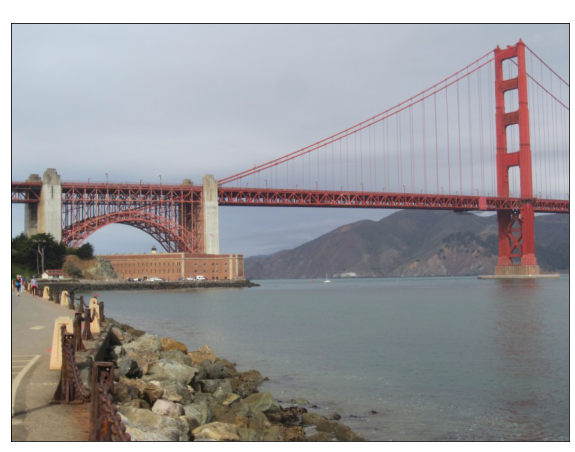

In [45]:
def suggest_locations(img_path):
    # get landmark predictions
    predicted_landmarks = predict_landmarks(img_path, 3)
    
    ## TODO: display image and display landmark predictions
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1, xticks=[], yticks=[])
    imgplot = plt.imshow(Image.open(img_path))
    
    predicted_landmarks = [landmark.replace('_', ' ') for landmark in predicted_landmarks]
    
    ax.set_title("Is this a picture of the {}, {}, or {}?".format(*predicted_landmarks), color='white')

# test on a sample image
suggest_locations('images/test/09.Golden_Gate_Bridge/190f3bae17c32c37.jpg')

### (IMPLEMENTATION) Test Your Algorithm

Test your algorithm by running the `suggest_locations` function on at least four images on your computer. Feel free to use any images you like.

__Question 4:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ (Three possible points for improvement)

Better. I suspected the red water and random crowd in the Trevi Fountain picture might throw off the CNN, but it appeared to be color invariant in this example image. Likewise for the Seattle Japanese Garden (SJG), I tried to find difficult-to-classify photos of it. The CNN struggled with the detailed door photo of the SJG, and the image of the turtles could have been taken just about anywhere.  If turtles only ever showed up in the training dataset for the SJG, and no other landmarks, then it's entirely possible with enough training photos the CNN would begin to classify pictures with turtles as belonging to the SJG.

1. Add more training photos. Specific fauna and flora local to each landmark, but without necessarily showing the landmark itself in the photo.
2. Train for more epochs. In this project I ran the ResNet50 for 20 training epochs, but I feel with a longer baking time the CNN could be improved.
3. Add further transforms to the input images, for example simulate different lighting conditions by modifying brightness, or colors. Or simulate an out-of-focus camera, by adding a blurring transform. The TrivialAugmentWide, RandAugment, GaussianBlur and ColorJitter transforms found here could do the trick: https://pytorch.org/vision/main/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-pyhttps://pytorch.org/vision/main/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py

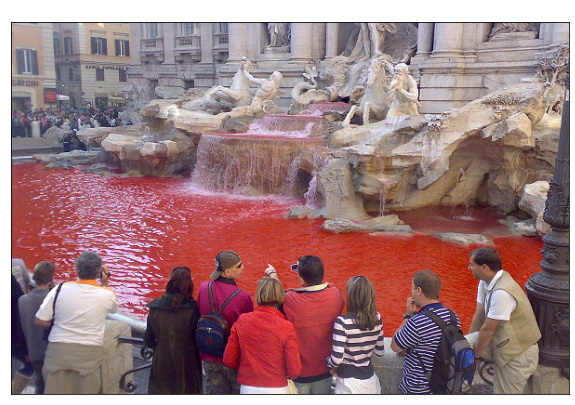

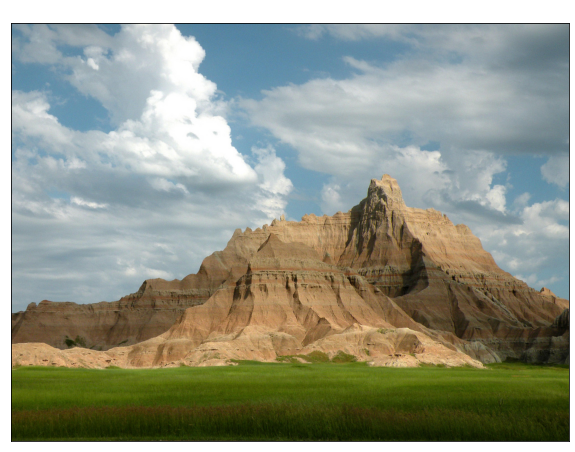

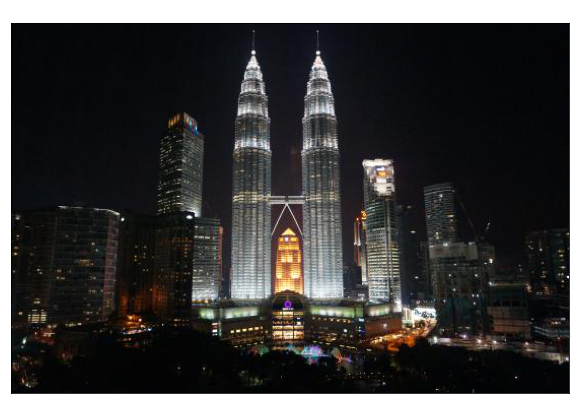

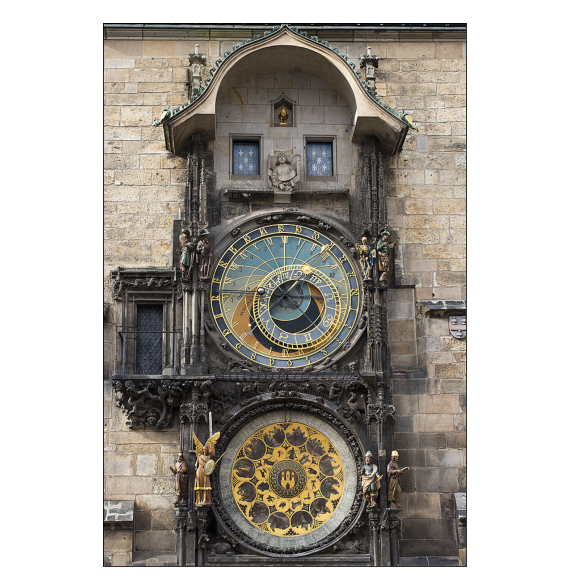

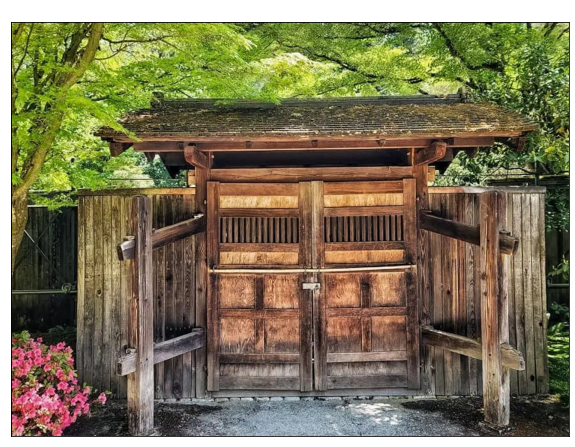

...

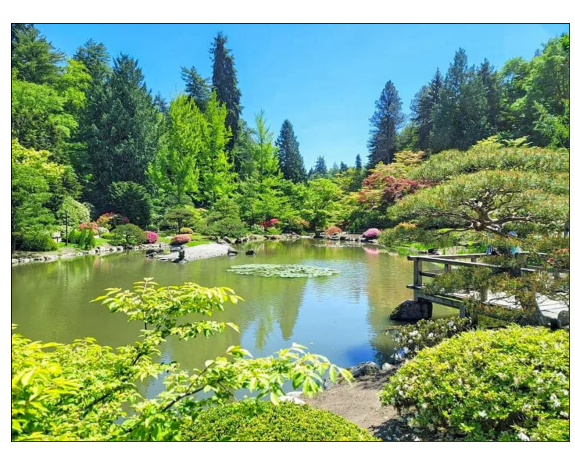

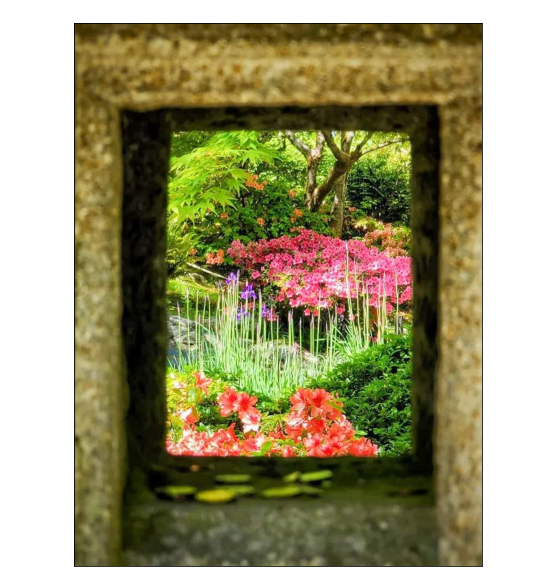

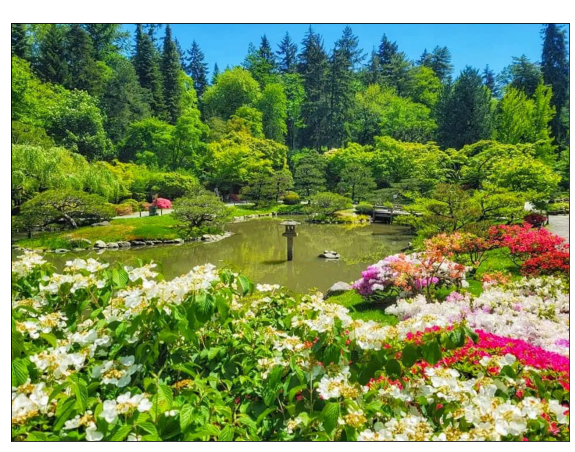

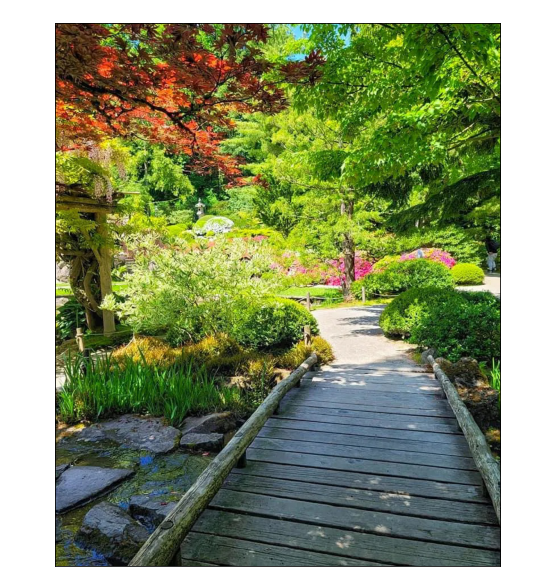

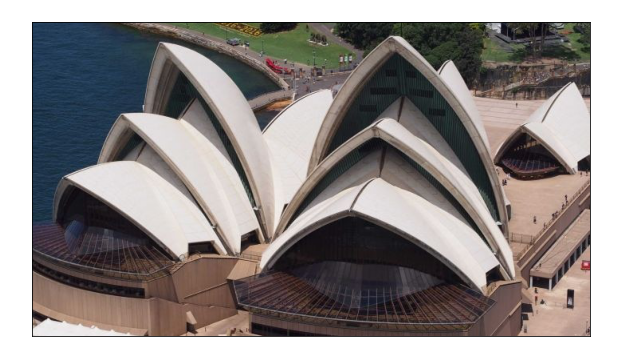

In [95]:
## TODO: Execute the `suggest_locations` function on
## at least 4 images on your computer.
## Feel free to use as many code cells as needed.

import glob

for img_path in glob.glob('suggest_locations\*.jpg'):
    suggest_locations(img_path)
